# Figures

In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import pandas as pd

from math import floor

import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

sns.set_theme(style="ticks")

import pickle

import plotly.graph_objects as go
from plotly.subplots import make_subplots

from math import exp, log, log10

from polymodel.config import Config

from polymodel.run import simulations_run

from polymodel.utils import (
    Fungicide,
    find_beta_vectorised,
    truncated_exp_pdf,
    logit10_vectorised,
    initial_point_distribution,
    trait_vec
)

from polymodel.consts import (
    DEFAULT_I0, 
    DEFAULT_BETA,
    MUTATION_PROP,
    FUNG_MUTATION_SCALE,
    HOST_MUTATION_SCALE,
    DEFAULT_P,
    TRAIN_TEST_SPLIT_PROPORTION
)

from plots.consts import GREY_LABEL

from plots.fns import (    
    get_arrow_annotation,
    get_text_annotation,
    standard_layout,
)

In [3]:
COLZ = sns.color_palette('muted').as_hex()

# Fig 2 - model fitting

## stb

In [4]:
filename = '../data/03_model_inputs/lambda_fitted.csv'

lambda_use = float(pd.read_csv(filename).iloc[:, 1])
lambda_use

0.0328774362127231

In [5]:
sev_x = np.linspace(-0.5,100.5,301)
severity_pdf = [truncated_exp_pdf(ii, lambda_use) for ii in sev_x]

In [6]:
stb_values = pd.read_csv('../data/03_model_inputs/stb_vals.csv')

## beta

In [7]:
beta_hist = pd.read_csv('../data/03_model_inputs/beta_from_data_not_sampled_dist.csv').betas

In [8]:
beta_values = pd.read_csv('../data/03_model_inputs/beta_sampled.csv')
beta_median = beta_values.median()
beta_vals = beta_values.loc[lambda df: df.beta>1e-5].beta

In [9]:
bds = logit10_vectorised(0.01*np.array([0.04,99.5]))

In [10]:
yy = np.linspace(bds[0], bds[1], 200)

x_logit = 100 * 10**(yy)/(1+10**(yy))

In [11]:
beta_xs = find_beta_vectorised(
    0.01*x_logit,
    DEFAULT_I0,
    tol=1e-6
)

In [12]:
gdt = np.gradient(x_logit, beta_xs)

In [13]:
sev_pdf = [truncated_exp_pdf(ii, lambda_use) for ii in x_logit]

In [14]:
beta_pdf = gdt * sev_pdf

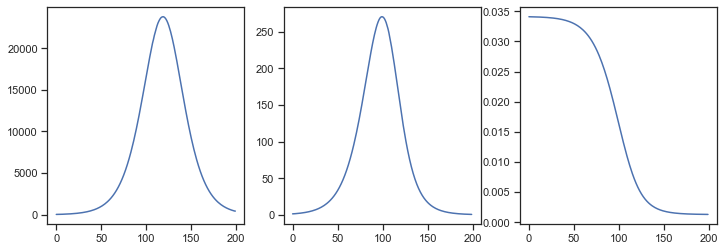

In [15]:
f, ax = plt.subplots(1, 3, figsize=(12,4))

ax[0].plot(gdt)
ax[1].plot(beta_pdf)
ax[2].plot(sev_pdf)

## yield

In [16]:
ydf_use = pd.read_csv('../data/03_model_inputs/yield_vs_stb.csv')

In [17]:
xp = np.linspace(0,1,100)

with open('gam.pickle', 'rb') as f:
    g = pickle.load(f)

preds_df = pd.DataFrame(dict(x=xp, GAM=g.predict(xp)))

## fit

In [18]:
conf_fit = Config(
    'single', 
    n_k=400,
    n_l=50,
    sprays=[1],
    host_on=[False],
    mutation_proportion=MUTATION_PROP,
    mutation_scale_fung=DEFAULT_P * FUNG_MUTATION_SCALE,
    mutation_scale_host=DEFAULT_P * HOST_MUTATION_SCALE,
)

CONFIG
------
I0_single = 0.0098570319660089
beta_single = 0.0078654159996959
host_on = [False]
k_b = 0.8431572316700577
k_mu = 9.44286788381916
l_b = 6.585357214619326
l_mu = 0.8089358816813786
mutation_proportion = 1.234375e-05
mutation_scale_fung = 0.0019836158401698102
mutation_scale_host = 0.0019836158401698102
n_iterations = None
n_k = 400
n_l = 50
n_years = 15
replace_cultivars = None
sprays = [1]
type = single



In [19]:
# control_df = pd.read_csv('../data/03_model_inputs/control_prothio.csv')
control_df = pd.read_csv('../data/03_model_inputs/control_prothio_with_uncertainty.csv')

In [20]:
betas_fit = find_beta_vectorised(
    [0.37]*len(control_df.year.unique()),
    DEFAULT_I0
)

betas_fit

array([0.00877344, 0.00877344, 0.00877344, 0.00877344, 0.00877344,
       0.00877344, 0.00877344, 0.00877344, 0.00877344, 0.00877344,
       0.00877344, 0.00877344, 0.00877344, 0.00877344, 0.00877344,
       0.00877344, 0.00877344, 0.00877344])

In [21]:
soln_fit = simulations_run(
    conf_fit, 
    I0_vec_run=[DEFAULT_I0]*len(betas_fit),
    beta_vec_run=betas_fit,
)

In [22]:
dsf = soln_fit['spray_Y1_host_N']['dis_sev']

In [23]:
control_vec = 1 - dsf / 0.37

In [35]:
def fitting_plot(
        stb_vals,
        beta_vals,
        beta_median,
        sev_x,
        sev_pdf,
        beta_x,
        beta_pdf,
        preds_df,
        yield_df,
        control_df,
        control_vec,
    ):
    
    col0 = COLZ[0]
    col1 = COLZ[1]
    col2 = 'black'
    col3 = 'red' # test line
    col4 = 'cyan' # median line
    
    fig = make_subplots(
        rows=2,
        cols=2,
        # shared_xaxes=True,
        horizontal_spacing=0.25,
    )
    
    # ROW 1 COL 1
    
    sev_pdf_trc = go.Scatter(
        x=sev_x, y=sev_pdf, showlegend=False,
        line=dict(color=col1, width=3)
    )
    
    stb_hist = go.Histogram(
        x=stb_vals, 
        nbinsx=40,
        xbins={'start': 0, 'end': 100},
        histnorm="probability density",
        showlegend=False,
        marker=dict(color=col0),
    )
    
    trcs_11 = [stb_hist, sev_pdf_trc]
    
    # ROW 1 COL 2
    
    beta_hist = go.Histogram(
        x=beta_vals, 
        nbinsx=40,
        name='Data',
        legendgroup=0,
        # xbins={'start': 0, 'end': 100},
        histnorm="probability density",
        showlegend=True,
        marker=dict(color=col0),
    )
    
    med_trc = go.Scatter(x=[beta_median, beta_median], y=[0, 260], mode='lines', 
                        name='Median ' + u'\u03B2' + '<sub>0</sub>',
                        legendgroup=0,
                        line=dict(color=col4, width=3, dash='dash'),
                        showlegend=True)
    
    beta_pdf_trc = go.Scatter(x=beta_x, y=beta_pdf, showlegend=False, 
                              line=dict(color=col1, width=3))
    
    trcs_12 = [beta_hist, med_trc, beta_pdf_trc]
    
    # ROW 2 COL 1
    
    line = go.Scatter(x=100*preds_df.x, y=preds_df.GAM, showlegend=False, 
                         line=dict(color=col1, width=3), mode='lines')
    
    scatter = go.Scatter(x=100*yield_df.stb, y=yield_df.yld, showlegend=False, 
                         # marker=dict(color=col0, opacity=0.5),
                         marker=dict(
                            color=col0,
                            opacity=0.5,
                            size=5,
                            line=dict(width=1, color='rgba(0,0,0,0.5)')
                         ),
                         mode='markers')
    
    trcs_21 = [scatter, line]
    
    # ROW 2 COL 2
    
    model_df = (
        control_df
        .groupby('year').first()
        .reset_index()
        .loc[:, ['year']]
        .assign(model=100*control_vec)
    )
    
    scatter_c = go.Scatter(
        x=control_df.year + np.random.normal(0, 0.05, len(control_df)), 
        y=control_df.control_with_noise_t,
        showlegend=False,
        marker=dict(
            color=col0,
            opacity=0.1,
            size=5,
            line=dict(width=1, color='rgba(0,0,0,0.5)')
        ),
        mode='markers')

    split_year = floor(
        control_df.year.min() - 1
        + TRAIN_TEST_SPLIT_PROPORTION * (1 + control_df.year.max() - control_df.year.min())
    )
    
    cdft = model_df.loc[lambda df: df.year<=split_year]
    cdfte = model_df.loc[lambda df: df.year>=split_year]
    
    line_train = go.Scatter(x=cdft.year, y=cdft.model, showlegend=True,
                          name='Model fit',
                          legendgroup=1,
                          line=dict(color=col1, width=3.5), mode='lines')
    
    line_test = go.Scatter(x=cdfte.year, y=cdfte.model, showlegend=True,
                          name='Model prediction (test data)',
                          legendgroup=1,
                          line=dict(color=col3, width=4, dash='dot'), mode='lines')
    
#     line_new = go.Scatter(x=cdfte.year, y=cdfte.model, showlegend=False,
#                           line=dict(color='red', dash='dot'), mode='lines')
                
    trcs_22 = [scatter_c, line_train, line_test]
    
    fig.add_traces(trcs_11, rows=1, cols=1)
    fig.add_traces(trcs_21, rows=2, cols=1)
    fig.add_traces(trcs_12, rows=1, cols=2)
    fig.add_traces(trcs_22, rows=2, cols=2)
    
    # ANNOTATIONS
    
    row1 = 1.05
    row2 = 0.47
    
    col1 = -0.01
    col2 = 0.61
    
    annotz = [
        get_text_annotation(col1, row1, 'A', size=20),
        get_text_annotation(col1, row2, 'B', size=20),
        get_text_annotation(col2, row1, 'C', size=20),
        get_text_annotation(col2, row2, 'D', size=20),
    ]
    
    fig.update_layout(standard_layout(True, height=750))
    fig.update_layout(
        font=dict(size=14),
        legend=dict(
            y=1.15,
            x=0,
            orientation='h',
            xanchor='left',
        ),
        annotations=annotz
    )
    
    fig.update_xaxes(title='Severity (%)', row=1, col=1)
    fig.update_xaxes(title='Infection rate (' + u'\u03B2' + '<sub>0</sub>, dd<sup>-1</sup>)', row=1, col=2)
    
    fig.update_xaxes(title='Severity (%)', row=2, col=1)
    fig.update_xaxes(title='Year', row=2, col=2)
    
    fig.update_yaxes(title='Probability density', row=1, col=1)
    fig.update_yaxes(title='Probability density', row=1, col=2)
    fig.update_yaxes(title='Yield (tons/ha)', row=2, col=1)
    fig.update_yaxes(title='Control (%)', row=2, col=2)
    
    return fig

## FIG

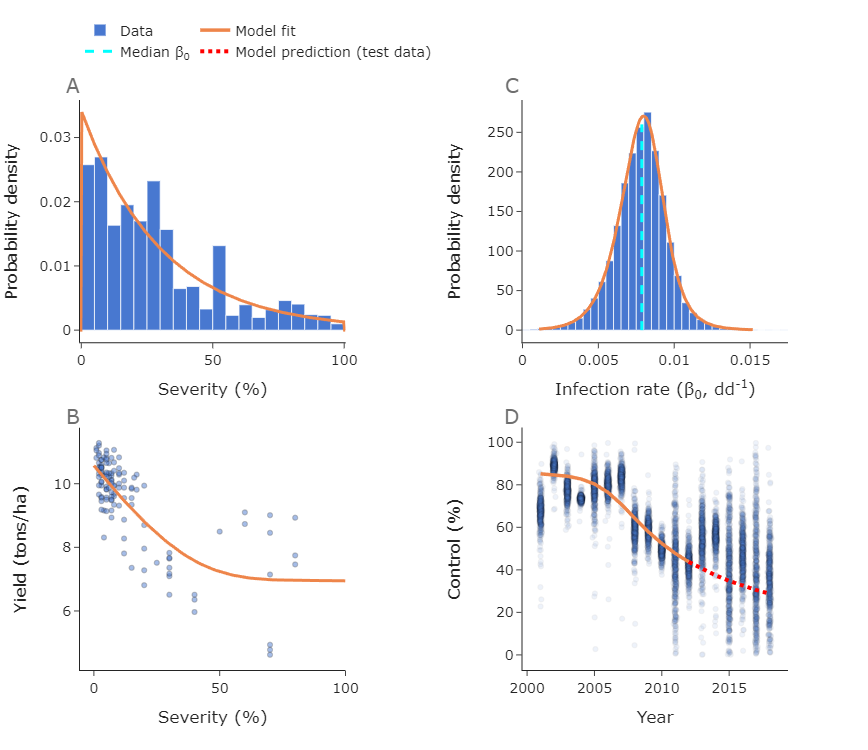

In [36]:
f = fitting_plot(
    stb_values.stb,
    beta_vals,
    DEFAULT_BETA,
    sev_x,
    severity_pdf,
    beta_xs,
    beta_pdf,
    preds_df,
    ydf_use,
    control_df,
    control_vec,
)

f.show()

In [37]:
f.write_image('../figures/paper_figs/fig2_fitting.png', scale=4)

In [44]:
- np.log(0.5)  / (1.2 * 16)

0.03610141565416382